#object detection

In [ ]:
!pip uninstall -y torch
!pip uninstall -y torchvision
!pip install torch==1.10.0 torchvision==0.11.1

import torch
# Install detectron2
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# clone and install Detic
!git clone https://github.com/facebookresearch/Detic.git --recurse-submodules
%cd Detic
!pip install -r requirements.txt

Found existing installation: torch 1.12.1+cu113
Uninstalling torch-1.12.1+cu113:
  Successfully uninstalled torch-1.12.1+cu113
Found existing installation: torchvision 0.13.1+cu113
Uninstalling torchvision-0.13.1+cu113:
  Successfully uninstalled torchvision-0.13.1+cu113
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |██████████████████████████████▎ | 834.1 MB 1.2 MB/s eta 0:00:40tcmalloc: large alloc 1147494400 bytes == 0x6529a000 @  0x7f15df340615 0x58ead6 0x4f355e 0x4d222f 0x51041f 0x5b4ee6 0x58ff2e 0x510325 0x5b4ee6 0x58ff2e 0x50d482 0x4d00fb 0x50cb8d 0x4d00fb 0x50cb8d 0x4d00fb 0x50cb8d 0x4bac0a 0x538a76 0x590ae5 0x510280 0x5b4ee6 0x58ff2e 0x50d482 0x5b4ee6 0x58ff2e 0x50c4fc 0x58fd37 0x50ca37 0x5b4ee6 0x58ff2e
     |████████████████████████████████| 881.9 MB 19 kB/s 
     |████████████████████████████████| 23.3 MB 1.3 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are install

Cloning into 'Detic'...
remote: Enumerating objects: 206, done.
remote: Counting objects: 100% (67/67), done.
remote: Compressing objects: 100% (41/41), done.
remote: Total 206 (delta 33), reused 40 (delta 26), pack-reused 139
Receiving objects: 100% (206/206), 3.59 MiB | 813.00 KiB/s, done.
Resolving deltas: 100% (72/72), done.
Submodule 'third_party/CenterNet2' (https://github.com/xingyizhou/CenterNet2.git) registered for path 'third_party/CenterNet2'
Submodule 'third_party/Deformable-DETR' (https://github.com/fundamentalvision/Deformable-DETR.git) registered for path 'third_party/Deformable-DETR'
Cloning into '/content/Detic/third_party/CenterNet2'...
remote: Enumerating objects: 13921, done.        
remote: Counting objects: 100% (944/944), done.        
remote: Compressing objects: 100% (93/93), done.        
remote: Total 13921 (delta 885), reused 855 (delta 849), pack-reused 12977        
Receiving objects: 100% (13921/13921), 5.08 MiB | 12.74 MiB/s, done.
Resolving deltas: 100%

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import sys
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Detic libraries
sys.path.insert(0, 'third_party/CenterNet2/')
from centernet.config import add_centernet_config
from detic.config import add_detic_config
from detic.modeling.utils import reset_cls_test

In [ ]:
# Build the detector and download our pretrained weights
cfg = get_cfg()
add_centernet_config(cfg)
add_detic_config(cfg)
cfg.merge_from_file("configs/Detic_LCOCOI21k_CLIP_SwinB_896b32_4x_ft4x_max-size.yaml")
cfg.MODEL.WEIGHTS = 'https://dl.fbaipublicfiles.com/detic/Detic_LCOCOI21k_CLIP_SwinB_896b32_4x_ft4x_max-size.pth'
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.ROI_BOX_HEAD.ZEROSHOT_WEIGHT_PATH = 'rand'
cfg.MODEL.ROI_HEADS.ONE_CLASS_PER_PROPOSAL = False # For better visualization purpose. Set to False for all classes.
# cfg.MODEL.DEVICE='cpu' # uncomment this to use cpu-only mode.
predictor = DefaultPredictor(cfg)

/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Detic_LCOCOI21k_CLIP_SwinB_896b32_4x_ft4x_max-size.pth: 702MB [00:31, 22.1MB/s]                           


In [ ]:
# Run inference on ImageNet-21K vocabulary
## Collect class names
from nltk.corpus import wordnet
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')

!wget https://storage.googleapis.com/bit_models/imagenet21k_wordnet_ids.txt
wnids = [x.strip() for x in open('imagenet21k_wordnet_ids.txt', 'r')]

in21k_class_names = []
for wnid in wnids:
    synset = wordnet.synset_from_pos_and_offset('n', int(wnid[1:]))
    synonyms = [x.name() for x in synset.lemmas()]
    in21k_class_names.append(synonyms[0])
print(in21k_class_names)

## Reset classifiers for 21K classes
metadata = MetadataCatalog.get("in21k")
metadata.thing_classes = in21k_class_names
num_classes = len(metadata.thing_classes)
prompt='a '

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


--2022-10-22 09:21:03--  https://storage.googleapis.com/bit_models/imagenet21k_wordnet_ids.txt
Resolving storage.googleapis.com (storage.googleapis.com)... 172.217.218.128, 142.251.18.128, 142.250.153.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.217.218.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 218430 (213K) [text/plain]
Saving to: ‘imagenet21k_wordnet_ids.txt.1’

imagenet21k_wordnet 100%[===================>] 213.31K  --.-KB/s    in 0.005s  

2022-10-22 09:21:03 (39.0 MB/s) - ‘imagenet21k_wordnet_ids.txt.1’ saved [218430/218430]

['organism', 'benthos', 'heterotroph', 'cell', 'person', 'animal', 'plant', 'food', 'artifact', 'hop', 'check-in', 'dressage', 'curvet', 'piaffe', 'funambulism', 'rock_climbing', 'contact_sport', 'outdoor_sport', 'gymnastics', 'acrobatics', 'track_and_field', 'track', 'jumping', 'broad_jump', 'high_jump', 'Fosbury_flop', 'skiing', 'cross-country_skiing', 'ski_jumping', 'water_sport', 'swimming'

--2022-10-22 09:21:04--  https://web.eecs.umich.edu/~fouhey/fun/desk/desk.jpg
Resolving web.eecs.umich.edu (web.eecs.umich.edu)... 141.212.113.214
Connecting to web.eecs.umich.edu (web.eecs.umich.edu)|141.212.113.214|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 289506 (283K) [image/jpeg]
Saving to: ‘desk.jpg’

desk.jpg            100%[===================>] 282.72K   691KB/s    in 0.4s    

2022-10-22 09:21:05 (691 KB/s) - ‘desk.jpg’ saved [289506/289506]



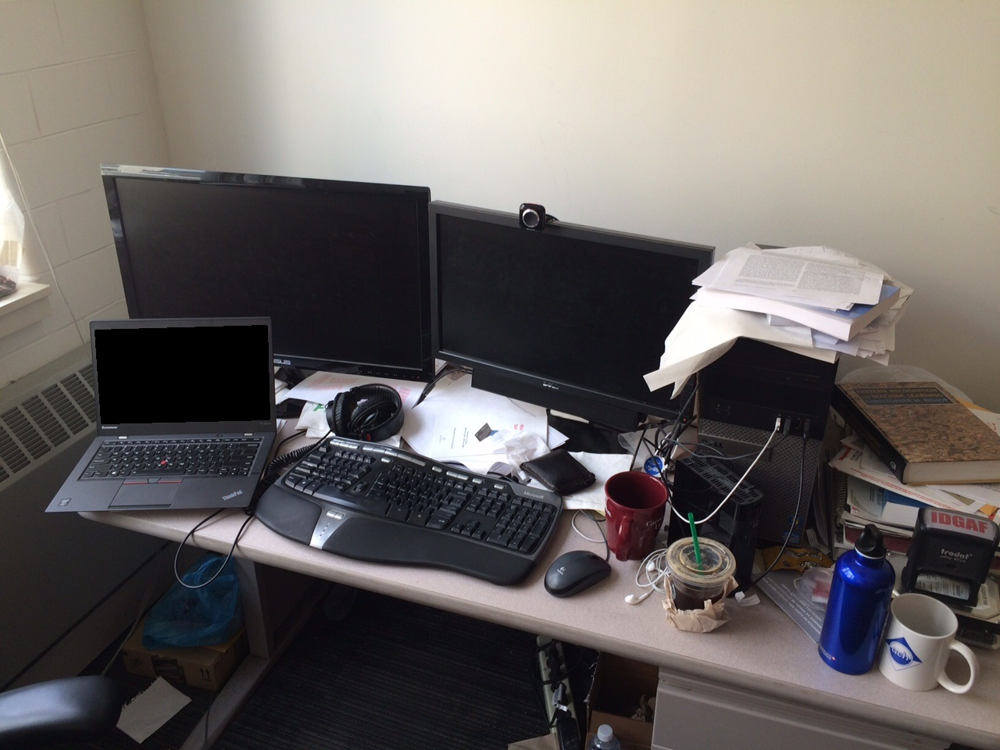

In [ ]:
# Download a sample image and display. Replace path here to try your own images!
!wget https://web.eecs.umich.edu/~fouhey/fun/desk/desk.jpg
im = cv2.imread("./desk.jpg")
cv2_imshow(im)

In [ ]:
from detic.modeling.text.text_encoder import build_text_encoder

In [ ]:
import torch

100%|███████████████████████████████████████| 338M/338M [00:27<00:00, 12.8MiB/s]


Loading pretrained CLIP
0
1024
2048
3072
4096
5120
6144
7168
8192
9216
10240
11264
12288
13312
14336
15360
16384
17408
18432
19456
20480
21504


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


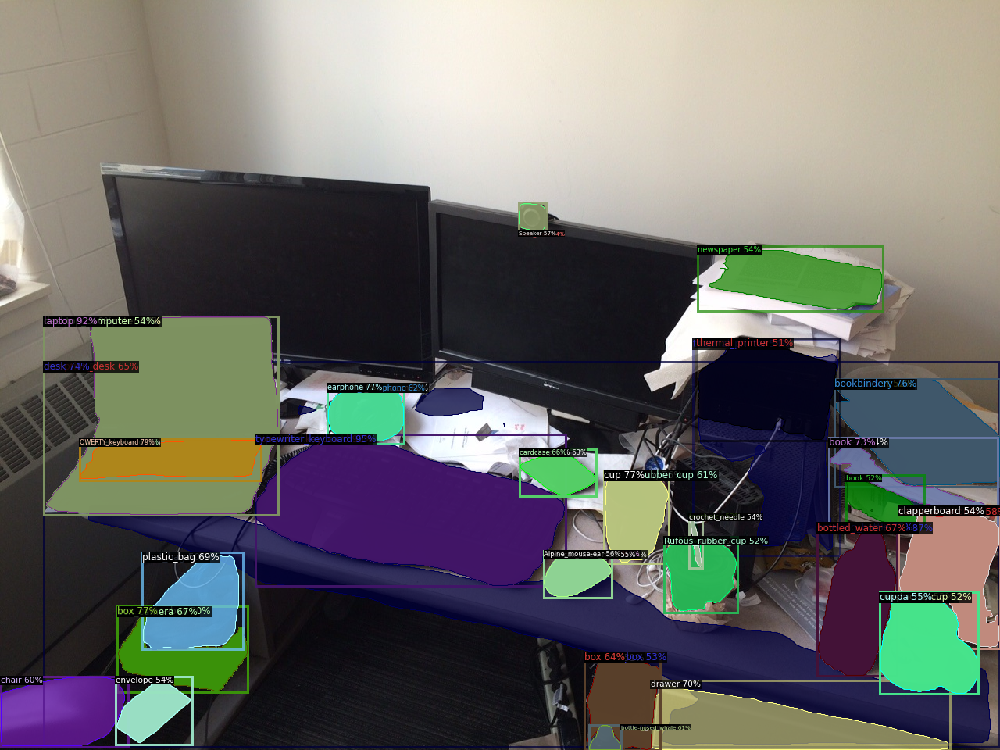

In [ ]:


text_encoder = build_text_encoder(pretrain=True)
text_encoder.eval()
text_encoder = text_encoder.cuda()

classifier = []
batch_size = 1024
i = 0
while i < num_classes:
    print(i)
    batch_names = in21k_class_names[i: min(i + batch_size, num_classes)]
    texts = [prompt + x for x in batch_names]
    with torch.no_grad():
        emb = text_encoder(texts).detach().permute(1, 0).contiguous().cpu()
    classifier.append(emb)
    i += batch_size
classifier = torch.cat(classifier, dim=1)
reset_cls_test(predictor.model, classifier, num_classes)

## Run on image
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], metadata)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
outputs['instances']

Instances(num_instances=138, image_height=960, image_width=1280, fields=[pred_boxes: Boxes(tensor([[3.2675e+02, 5.5583e+02, 7.2367e+02, 7.5038e+02],
        [3.2675e+02, 5.5583e+02, 7.2367e+02, 7.5038e+02],
        [1.0682e+03, 4.8525e+02, 1.2800e+03, 6.2252e+02],
        [1.0682e+03, 4.8525e+02, 1.2800e+03, 6.2252e+02],
        [5.6118e+01, 4.0452e+02, 3.5594e+02, 6.5932e+02],
        [3.2675e+02, 5.5583e+02, 7.2367e+02, 7.5038e+02],
        [5.6118e+01, 4.0452e+02, 3.5594e+02, 6.5932e+02],
        [1.0157e+02, 5.6194e+02, 3.3427e+02, 6.1452e+02],
        [1.0157e+02, 5.6194e+02, 3.3427e+02, 6.1452e+02],
        [1.0455e+03, 6.6909e+02, 1.1484e+03, 8.6513e+02],
        [5.6118e+01, 4.0452e+02, 3.5594e+02, 6.5932e+02],
        [1.0157e+02, 5.6194e+02, 3.3427e+02, 6.1452e+02],
        [1.0455e+03, 6.6909e+02, 1.1484e+03, 8.6513e+02],
        [1.0455e+03, 6.6909e+02, 1.1484e+03, 8.6513e+02],
        [1.0455e+03, 6.6909e+02, 1.1484e+03, 8.6513e+02],
        [4.1918e+02, 4.9108e+02, 5.1742

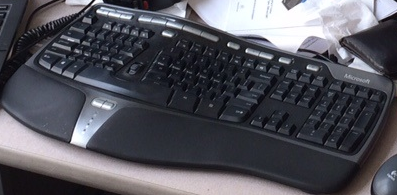

computer_keyboard coord:  326 555 723 750 0.94741434


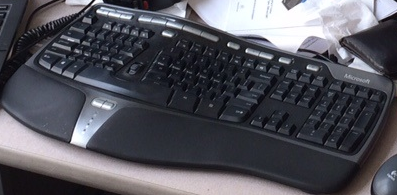

typewriter_keyboard coord:  326 555 723 750 0.9471942


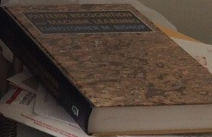

book coord:  1068 485 1280 622 0.9261877


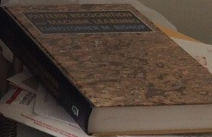

book coord:  1068 485 1280 622 0.9261877


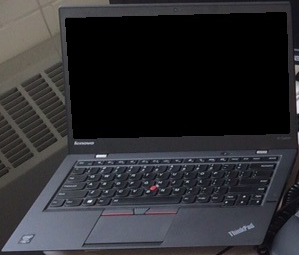

laptop coord:  56 404 355 659 0.91696143


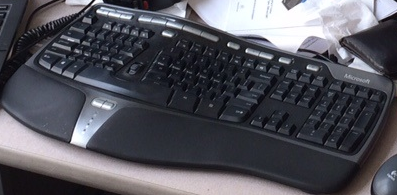

QWERTY_keyboard coord:  326 555 723 750 0.88413686


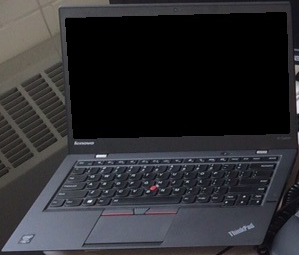

portable_computer coord:  56 404 355 659 0.8827935


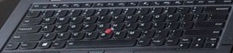

typewriter_keyboard coord:  101 561 334 614 0.88123393


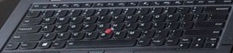

computer_keyboard coord:  101 561 334 614 0.8806168


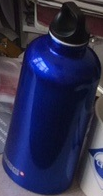

bottle-nosed_whale coord:  1045 669 1148 865 0.87388873


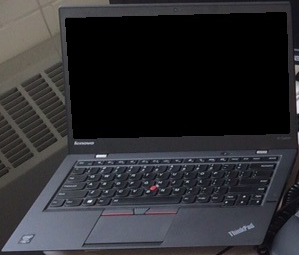

briefcase_computer coord:  56 404 355 659 0.86514825


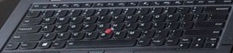

QWERTY_keyboard coord:  101 561 334 614 0.794277


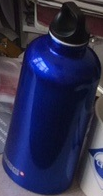

bottle coord:  1045 669 1148 865 0.7934171


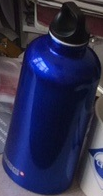

bottle coord:  1045 669 1148 865 0.7934171


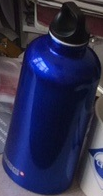

ink_bottle coord:  1045 669 1148 865 0.7778312


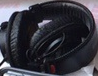

earphone coord:  419 491 517 567 0.77134764


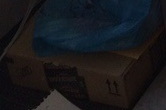

box coord:  150 776 316 886 0.7674009


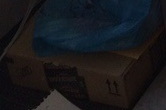

box coord:  150 776 316 886 0.7674009


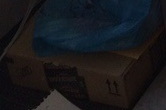

box coord:  150 776 316 886 0.7674009


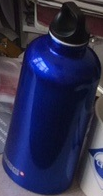

smelling_bottle coord:  1045 669 1148 865 0.7671104


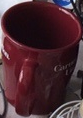

cup coord:  773 602 856 720 0.7651967


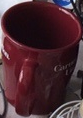

cup coord:  773 602 856 720 0.7651967


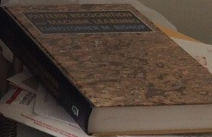

bookbindery coord:  1068 485 1280 622 0.7642034


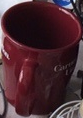

coffee_mug coord:  773 602 856 720 0.76304084


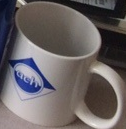

coffee_mug coord:  1125 758 1251 887 0.7531949


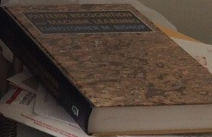

bindery coord:  1068 485 1280 622 0.7506285


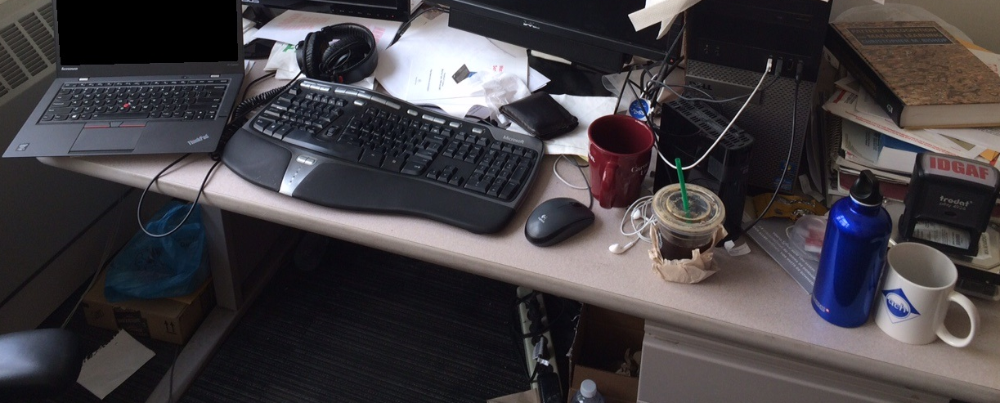

desk coord:  55 463 1278 956 0.7366231


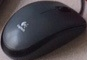

jerboa_rat coord:  696 704 783 764 0.73003733


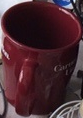

mug coord:  773 602 856 720 0.72715384


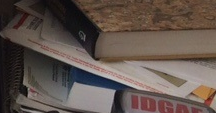

book coord:  1061 560 1277 673 0.72699594


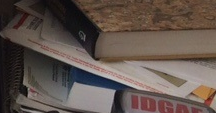

book coord:  1061 560 1277 673 0.72699594


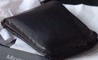

wallet coord:  664 574 762 634 0.72337556


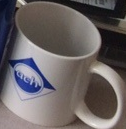

mug coord:  1125 758 1251 887 0.71855366


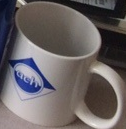

cup coord:  1125 758 1251 887 0.7076713


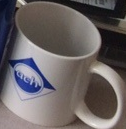

cup coord:  1125 758 1251 887 0.7076713


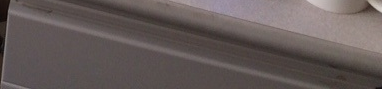

drawer coord:  833 871 1215 960 0.7017094


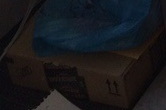

packing_box coord:  150 776 316 886 0.69213265


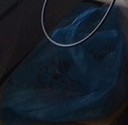

plastic_bag coord:  182 706 310 831 0.6906007


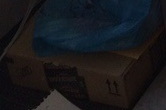

cat_box coord:  150 776 316 886 0.67752856


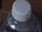

bottle coord:  753 928 795 960 0.67418206


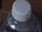

bottle coord:  753 928 795 960 0.67418206


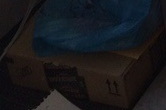

box_camera coord:  150 776 316 886 0.67051286


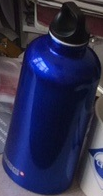

bottled_water coord:  1045 669 1148 865 0.66866475


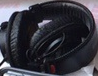

headset coord:  419 491 517 567 0.6685657


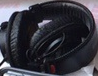

earmuff coord:  419 491 517 567 0.6676225


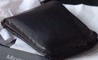

cardcase coord:  664 574 762 634 0.66431564


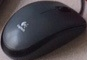

grasshopper_mouse coord:  696 704 783 764 0.6495228


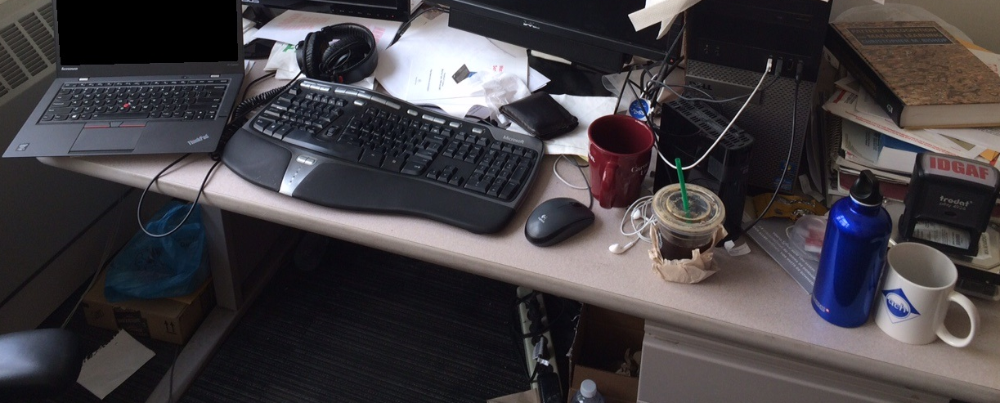

reception_desk coord:  55 463 1278 956 0.64941823


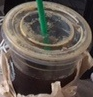

cup coord:  850 686 943 783 0.6462025


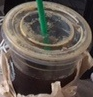

cup coord:  850 686 943 783 0.6462025


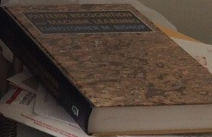

bookworm coord:  1068 485 1280 622 0.64614475


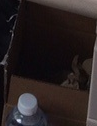

box coord:  747 834 844 960 0.6429703


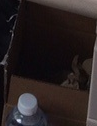

box coord:  747 834 844 960 0.6429703


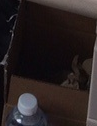

box coord:  747 834 844 960 0.6429703


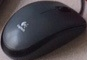

American_harvest_mouse coord:  696 704 783 764 0.6418286


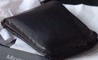

moleskin coord:  664 574 762 634 0.63479495


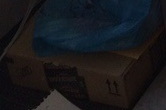

shoebox coord:  150 776 316 886 0.63057303


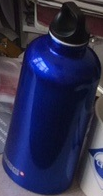

bottle_bank coord:  1045 669 1148 865 0.6295125


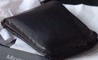

tobacco_pouch coord:  664 574 762 634 0.6258296


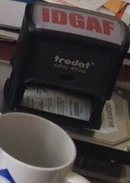

Rolodex coord:  1150 647 1280 830 0.61982006


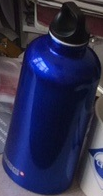

bottle_green coord:  1045 669 1148 865 0.61808974


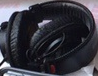

cardioid_microphone coord:  419 491 517 567 0.61703914


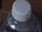

bottle-nosed_whale coord:  753 928 795 960 0.61336976


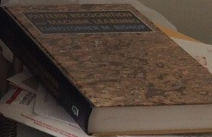

bookbinder coord:  1068 485 1280 622 0.6119922


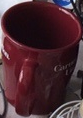

Rufous_rubber_cup coord:  773 602 856 720 0.61189324


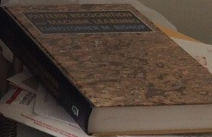

reader coord:  1068 485 1280 622 0.6111918


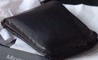

cardsharp coord:  664 574 762 634 0.6083425


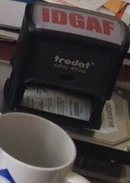

matchbook coord:  1150 647 1280 830 0.60702705


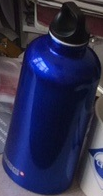

specimen_bottle coord:  1045 669 1148 865 0.60512924


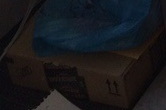

box_elder coord:  150 776 316 886 0.6045634


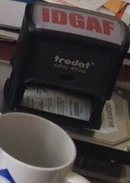

beeper coord:  1150 647 1280 830 0.60138303


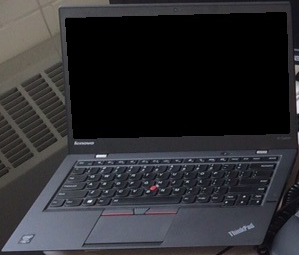

computer coord:  56 404 355 659 0.6013258


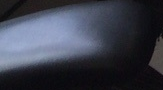

chair coord:  0 865 163 955 0.60066056


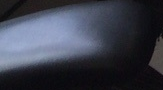

chair coord:  0 865 163 955 0.60066056


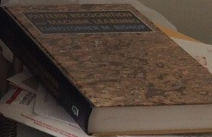

bookmobile coord:  1068 485 1280 622 0.60061187


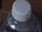

smelling_bottle coord:  753 928 795 960 0.59620273


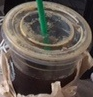

jar coord:  850 686 943 783 0.594795


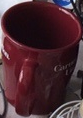

cuppa coord:  773 602 856 720 0.59377027


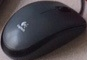

European_wood_mouse coord:  696 704 783 764 0.59184444


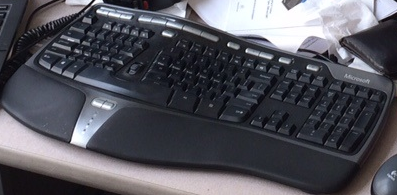

keyboard coord:  326 555 723 750 0.58703196


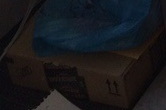

box_beam coord:  150 776 316 886 0.58633316


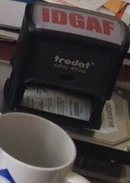

Polaroid coord:  1150 647 1280 830 0.5822489


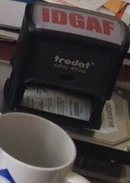

cassette_recorder coord:  1150 647 1280 830 0.5802243


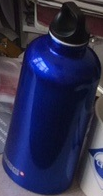

water_bottle coord:  1045 669 1148 865 0.57328737


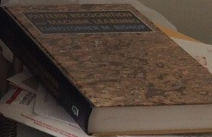

bookshop coord:  1068 485 1280 622 0.5725151


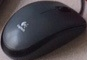

nude_mouse coord:  696 704 783 764 0.5661554


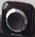

Speaker coord:  663 259 698 296 0.56551427


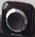

speaker coord:  663 259 698 296 0.56551427


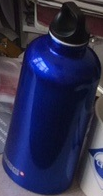

pop_bottle coord:  1045 669 1148 865 0.56352854


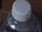

bottled_water coord:  753 928 795 960 0.5633772


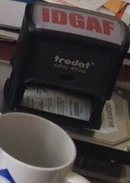

Polaroid_camera coord:  1150 647 1280 830 0.5625256


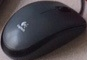

Alpine_mouse-ear coord:  696 704 783 764 0.5610894


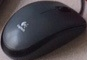

mouse_button coord:  696 704 783 764 0.56037706


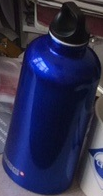

magnetic_bottle coord:  1045 669 1148 865 0.5592618


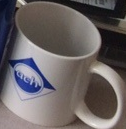

cuppa coord:  1125 758 1251 887 0.5526421


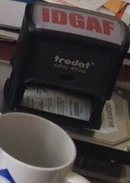

matchbox coord:  1150 647 1280 830 0.5498328


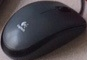

American_shrew_mole coord:  696 704 783 764 0.54677725


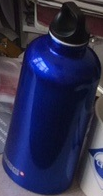

hot-water_bottle coord:  1045 669 1148 865 0.54357404


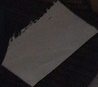

envelope coord:  147 865 245 952 0.5429641


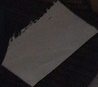

envelope coord:  147 865 245 952 0.5429641


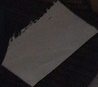

envelope coord:  147 865 245 952 0.5429641


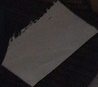

envelope coord:  147 865 245 952 0.5429639


pipefish coord:  881 657 899 727 0.542268


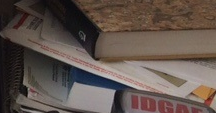

bindery coord:  1061 560 1277 673 0.5415033


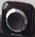

clock_radio coord:  663 259 698 296 0.54139304


crochet_needle coord:  881 657 899 727 0.54119456


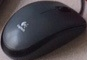

harvest_mouse coord:  696 704 783 764 0.54105675


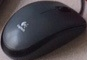

jerboa coord:  696 704 783 764 0.5400562


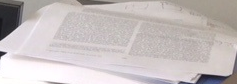

newspaper coord:  892 314 1129 398 0.5389523


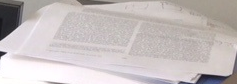

newspaper coord:  892 314 1129 398 0.5389523


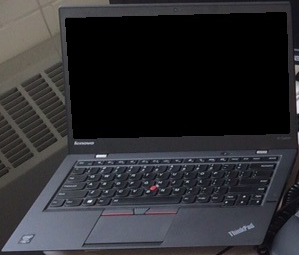

desktop_computer coord:  56 404 355 659 0.53841335


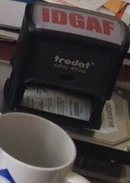

clapperboard coord:  1150 647 1280 830 0.53682643


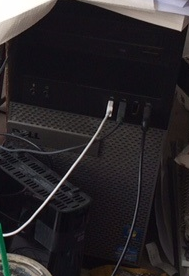

thermal_printer coord:  886 434 1075 710 0.5362828


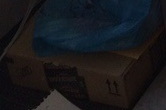

box_turtle coord:  150 776 316 886 0.5322323


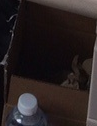

packing_box coord:  747 834 844 960 0.5284296


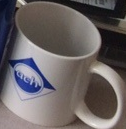

coffee_cup coord:  1125 758 1251 887 0.52604324


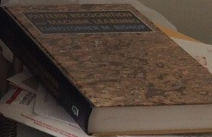

book_jacket coord:  1068 485 1280 622 0.5248462


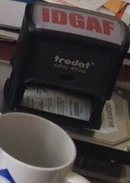

stamp coord:  1150 647 1280 830 0.52303135


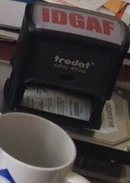

cassette_player coord:  1150 647 1280 830 0.5203645


toothpick coord:  881 657 899 727 0.5200409


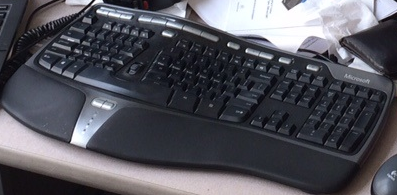

komondor coord:  326 555 723 750 0.5190572


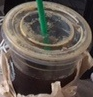

Rufous_rubber_cup coord:  850 686 943 783 0.51839274


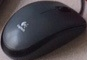

meadow_vole coord:  696 704 783 764 0.5170171


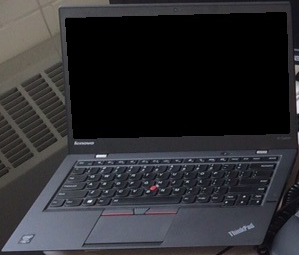

personal_computer coord:  56 404 355 659 0.5168217


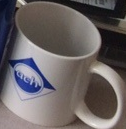

mustache_cup coord:  1125 758 1251 887 0.51597995


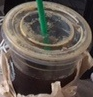

Leiden_jar coord:  850 686 943 783 0.5154978


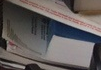

book coord:  1082 607 1183 677 0.51543015


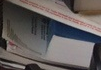

book coord:  1082 607 1183 677 0.51543015


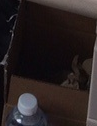

cat_box coord:  747 834 844 960 0.51476437


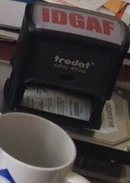

handstamp coord:  1150 647 1280 830 0.51448244


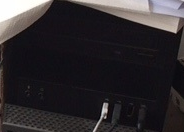

thermal_printer coord:  891 432 1075 564 0.5098963


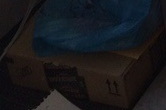

box_coat coord:  150 776 316 886 0.5082882


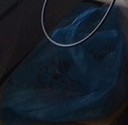

dust_bag coord:  182 706 310 831 0.5043772


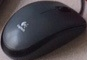

New_World_mouse coord:  696 704 783 764 0.5041966


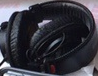

Geastrum_coronatum coord:  419 491 517 567 0.5034703


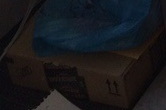

jack-in-the-box coord:  150 776 316 886 0.5003561


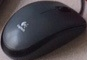

mouse coord:  696 704 783 764 0.5002922


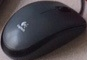

mouse coord:  696 704 783 764 0.5002922


In [ ]:
im_shape = im.shape
im_classes  = [metadata.thing_classes[x] for x in ((outputs["instances"].pred_classes.tolist()))]
for idx,y in enumerate(outputs['instances'].pred_boxes.tensor):
  # print(int(y.cpu().numpy()[0]))
  x0, y0, x1, y1 = int(y.cpu().numpy()[0]), int(y.cpu().numpy()[1]), int(y.cpu().numpy()[2]), int(y.cpu().numpy()[3])

  if x0<0 or x0>im_shape[1] or x1<x0 or x1<0 or x1>im_shape[1]:
    print('X issue ', im_classes[idx])

  if y0<0 or y0>im_shape[0] or y1<y0 or y1<0 or y1>im_shape[0]:
    print('Y issue ', im_classes[idx])

  cv2_imshow(im[y0:y1, x0:x1, :])
  print(im_classes[idx], 'coord: ', x0, y0, x1, y1, outputs['instances'].scores[idx].cpu().numpy())

  # if y0<0 or y1


  # break

#VOO

In [ ]:
import pandas as pd
df=pd.read_excel("/content/drive/MyDrive/VisualGenemo/21k_objs.xlsx")


In [ ]:
import pandas as pd
df1=pd.read_csv("/content/drive/MyDrive/VisualGenemo/flickr_detic_scores_final.csv")
df1

In [ ]:
# df colm image name and colum2 list of obj

In [ ]:
obj=list(df['objs'])

In [ ]:
words={}

In [ ]:
# image- dog, cat , man
# dog_cat=1+1
#dog_man
#cat_man

In [ ]:

e=0
x=list(df['txt'])
for i in x:
  print(e)
  e=e+1
  p=str(i).split(" ")
  p=list(set(p))
  for j in range(len(p)):
    for k in range(len(p)):
      s=p[j]+"_"+p[k]
      if s in words:
        c=words[s]
        words[s]=c+1
      else:
        words[s]=1

In [ ]:
e=0
x=list(df1['objects'])
for i1 in range(0,len(x)):
  i=x[i1]
  print(e)
  e=e+1
  p=str(i).split(",")
  p=list(set(p))
  for j in range(len(p)):
    for k in range(len(p)):
      s=p[j]+"*"+p[k]
      if s in words:
        c=words[s]
        words[s]=c+1
      else:
        words[s]=1


In [ ]:
import pandas as pd
df2=pd.read_csv("/content/drive/MyDrive/VisualGenemo/coco_detic_scores_final.csv")
df2

In [ ]:
e=0
x=list(df2['objects'])
for i1 in range(0,len(x)):
  i=x[i1]
  print(e)
  e=e+1
  p=str(i).split(",")
  p=list(set(p))
  for j in range(len(p)):
    for k in range(len(p)):
      s=p[j]+"*"+p[k]
      if s in words:
        c=words[s]
        words[s]=c+1
      else:
        words[s]=1




In [ ]:
#ob=[]
ob=obj
z=list(words.keys())
for i in z:
  s=i.split("*")
  ob.append(s[0])
  ob.append(s[1])

In [ ]:
o=set(ob)
ob=o

In [ ]:
len(ob)#25399#36173

COLLOCATION

In [ ]:
import numpy as np
col=np.zeros([len(ob),len(ob)])##  df column 2 list of

In [ ]:
ob=list(ob)
z=list(words.keys())
y=list(words.values())
for i in range(len(z)):
  print(i)
  try:
    #print(z[i])
    y1=z[i].split("*")
    s=y1[0]
    s1=y1[1]
    ind=ob.index(str(s))
    ind1=ob.index(str(s1))
    col[ind][ind1]=y[i]
    col[ind1][ind]=y[i]
  except:
    print("none")
    pass

In [ ]:
emb={}
for i in range(len(ob)):
  print(i)
  nor=1
  s=0
  for j in col[i]:
    s=s+j
  if s!=0:
    nor=s
  emb[obj[i]]= col[i]/nor

In [ ]:
A=list(emb.values())


In [ ]:
import numpy as np
from sklearn.decomposition import TruncatedSVD
svd =  TruncatedSVD(n_components = 512)
A_transformed = svd.fit_transform(A)


In [ ]:
voo={}
z=list(emb.keys())
for i in range(len(z)):
  voo[z[i]]=A_transformed[i]



ALPHA SVD FOR COLLOCATION

In [ ]:
embedding_size = 512
uu, ss, vv = linalg.svds(sparse.csr_matrix(col), embedding_size)
### do norm

In [ ]:
p = 0.5
svd_word_vecs = uu.dot(np.diag(ss**p))


In [ ]:
t_e={}
z= obj #list(emb.keys())
for i in range(len(z)):
  t_e[z[i]]=svd_word_vecs[i]



PPMI

In [ ]:
def get_ppmi_matrix(skipgrams, count_matrix, alpha=0.75):

    # for standard PPMI
    DD = sum(skipgrams.values())
    sum_over_contexts = np.array(count_matrix.sum(axis=1)).flatten()
    sum_over_words = np.array(count_matrix.sum(axis=0)).flatten()

    # for context distribution smoothing (cds)
    #sum_over_words_alpha = sum_over_words**alpha
    #Pc_alpha_denom = np.sum(sum_over_words_alpha)

    row_indxs = []
    col_indxs = []
    ppmi_dat_values = []   # positive pointwise mutual information

    for skipgram in tqdm(
        skipgrams.items(),
        total=len(skipgrams),
        desc='building ppmi matrix row,col,dat'
    ):

        ### change here
        #(tok_word_indx, tok_context_indx), pound_wc = skipgram
        a,pound_wc=skipgram
        #print(a)
        a1=a.split("_")[0]
        a2=a.split("_")[1]
        ### tok_word_ind ===   get the position form objs list
        try:
          tok_word_indx=obj.index(str(a1))
          tok_context_indx=obj.index(str(a2))
        except:
          continue





        pound_w = sum_over_contexts[tok_word_indx]
        pound_c = sum_over_words[tok_context_indx]
        #pound_c_alpha = sum_over_words_alpha[tok_context_indx]

        Pwc = pound_wc / DD
        Pw = pound_w / DD
        Pc = pound_c / DD
        #Pc_alpha = pound_c_alpha / Pc_alpha_denom

        pmi = np.log2(Pwc / (Pw * Pc))  #(Pw * Pc_alpha))
        ppmi = max(pmi, 0)

        row_indxs.append(tok_word_indx)
        col_indxs.append(tok_context_indx)
        ppmi_dat_values.append(ppmi)

    print('building ppmi matrix')
    return sparse.csr_matrix((ppmi_dat_values, (row_indxs, col_indxs)))


In [ ]:
ppmi_matrix = get_ppmi_matrix(words, col)

building ppmi matrix row,col,dat: 100%|██████████| 1397825/1397825 [07:44<00:00, 3007.42it/s]


building ppmi matrix


In [ ]:
ppmi=ppmi_matrix.toarray()

In [ ]:
A=[ppmi[i] for i in range(len(ppmi))]   #list(emb.values())


In [ ]:
import numpy as np
from sklearn.decomposition import TruncatedSVD
svd =  TruncatedSVD(n_components = 512)
A_transformed = svd.fit_transform(A)


In [ ]:
t_e={}
z= obj #list(emb.keys())
for i in range(len(z)):
  t_e[z[i]]=A_transformed[i]



with Alpha SVD

In [ ]:
embedding_size = 512
uu, ss, vv = linalg.svds(ppmi_matrix, embedding_size)

p = 0.5
svd_word_vecs = uu.dot(np.diag(ss**p))

t_e={}
z= obj #list(emb.keys())
for i in range(len(z)):
  t_e[z[i]]=svd_word_vecs[i]



#V_OW

In [ ]:
import pandas as pd
df1=pd.read_csv("/content/drive/MyDrive/flickr30k_images/results.csv",sep="|",header=None)

In [ ]:
import pandas as pd
df3=pd.read_csv("/content/drive/MyDrive/VisualGenemo/flickr_od.csv")
df3

In [ ]:
obj=list(df['objs'])

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
stop_words = set(stopwords.words('english'))


In [ ]:
words={}


In [ ]:

x=df1.columns
tx=df1[x[2]][1:]


e=0
for i in tx:
  print(e)
  e=e+1
  p=[]
  wordsList = nltk.word_tokenize(str(i))
  wordsList = [w for w in wordsList if not w in stop_words]
  tagged = nltk.pos_tag(wordsList)

  for j in tagged:
    if j[1]=="NN" or j[1]=="JJ" :#or j[1]=="RB" or j[1]=="VBG":
      p.append(j[0])
  p=list(set(p))
  for j in range(len(p)):
    for k in range(len(p)):
      s=p[j]+"_"+p[k]
      if s in words:
        c=words[s]
        words[s]=c+1
      else:
        words[s]=1




In [ ]:
df1=pd.read_csv("/content/drive/MyDrive/VisualGenemo/flickr_detic_scores_final.csv")


In [ ]:
e=0
x=list(df1['objects'])
for i1 in range(0,len(x)):
  i=x[i1]
  print(e)
  e=e+1
  p=str(i).split(",")
  p=list(set(p))
  for j in range(len(p)):
    for k in range(len(p)):
      s=p[j]+"_"+p[k]
      if s in words:
        c=words[s]
        words[s]=c+1
      else:
        words[s]=1




In [ ]:
e=0
x=list(df3['objects'])
for i1 in range(0,len(x),5):
  i=x[i1]
  print(e)
  e=e+1
  p=str(i).split(",")
  p=list(set(p))
  for j in range(len(p)):
    for k in range(len(p)):
      s=p[j]+"_"+p[k]
      if s in words:
        c=words[s]
        words[s]=c+1
      else:
        words[s]=1




In [ ]:
ow=[]
c=0
z=list(words.keys())
for i in z:
  s=i.split("_")
  ow.append(s[0])
  ow.append(s[1])
  c=c+1

In [ ]:
o=set(ow)
ow=o

In [ ]:
import numpy as np
col=np.zeros([len(ow),len(ow)])  ##3 len words + len objs

In [ ]:
len(words)

303602

In [ ]:
ow=list(ow)

z=list(words.keys())
y=list(words.values())

for i in range(len(z)):
  print(i)
  try:
    s,s1=z[i].split("_")
    ind=ow.index(str(s))
    ind1=ow.index(str(s1))
    col[ind][ind1]=y[i]
    col[ind1][ind]=y[i]
  except:
    pass

In [ ]:
for i in range(len(obj)):
  col[i][i]=1

In [ ]:
emb={}
for i in range(len(col)):
  print(i)
  nor=1
  s=0
  for j in col[i]:
    s=s+j
  if s!=0:
    nor=s
  emb[obj[i]]= col[i]/nor

In [ ]:
A=list(emb.values())


In [ ]:
import numpy as np
from sklearn.decomposition import TruncatedSVD
svd =  TruncatedSVD(n_components = 512)
A_transformed = svd.fit_transform(A)


In [ ]:
vow={}
z=list(emb.keys())
for i in range(len(z)):
  vow[z[i]]=A_transformed[i]



ALPHA SVD FOR COLLOCATION

In [ ]:
embedding_size = 512
uu, ss, vv = linalg.svds(sparse.csr_matrix(col), embedding_size)
### do norm

In [ ]:
p = 0.5
svd_word_vecs = uu.dot(np.diag(ss**p))


In [ ]:
t_e={}
z= obj #list(emb.keys())
for i in range(len(z)):
  t_e[z[i]]=svd_word_vecs[i]



PPMI

In [ ]:
def get_ppmi_matrix(skipgrams, count_matrix, alpha=0.75):

    # for standard PPMI
    DD = sum(skipgrams.values())
    sum_over_contexts = np.array(count_matrix.sum(axis=1)).flatten()
    sum_over_words = np.array(count_matrix.sum(axis=0)).flatten()

    # for context distribution smoothing (cds)
    #sum_over_words_alpha = sum_over_words**alpha
    #Pc_alpha_denom = np.sum(sum_over_words_alpha)

    row_indxs = []
    col_indxs = []
    ppmi_dat_values = []   # positive pointwise mutual information

    for skipgram in tqdm(
        skipgrams.items(),
        total=len(skipgrams),
        desc='building ppmi matrix row,col,dat'
    ):

        ### change here
        #(tok_word_indx, tok_context_indx), pound_wc = skipgram
        a,pound_wc=skipgram
        #print(a)
        a1=a.split("_")[0]
        a2=a.split("_")[1]
        ### tok_word_ind ===   get the position form objs list
        try:
          tok_word_indx=obj.index(str(a1))
          tok_context_indx=obj.index(str(a2))
        except:
          continue





        pound_w = sum_over_contexts[tok_word_indx]
        pound_c = sum_over_words[tok_context_indx]
        #pound_c_alpha = sum_over_words_alpha[tok_context_indx]

        Pwc = pound_wc / DD
        Pw = pound_w / DD
        Pc = pound_c / DD
        #Pc_alpha = pound_c_alpha / Pc_alpha_denom

        pmi = np.log2(Pwc / (Pw * Pc))  #(Pw * Pc_alpha))
        ppmi = max(pmi, 0)

        row_indxs.append(tok_word_indx)
        col_indxs.append(tok_context_indx)
        ppmi_dat_values.append(ppmi)

    print('building ppmi matrix')
    return sparse.csr_matrix((ppmi_dat_values, (row_indxs, col_indxs)))


In [ ]:
ppmi_matrix = get_ppmi_matrix(words, col)

building ppmi matrix row,col,dat: 100%|██████████| 1397825/1397825 [07:44<00:00, 3007.42it/s]


building ppmi matrix


In [ ]:
ppmi=ppmi_matrix.toarray()

In [ ]:
A=[ppmi[i] for i in range(len(ppmi))]   #list(emb.values())


In [ ]:
import numpy as np
from sklearn.decomposition import TruncatedSVD
svd =  TruncatedSVD(n_components = 512)
A_transformed = svd.fit_transform(A)


In [ ]:
t_e={}
z= obj #list(emb.keys())
for i in range(len(z)):
  t_e[z[i]]=A_transformed[i]



with Alpha SVD

In [ ]:
embedding_size = 512
uu, ss, vv = linalg.svds(ppmi_matrix, embedding_size)

p = 0.5
svd_word_vecs = uu.dot(np.diag(ss**p))

t_e={}
z= obj #list(emb.keys())
for i in range(len(z)):
  t_e[z[i]]=svd_word_vecs[i]



#V_wor

IMAGE EMBEDDING

In [ ]:
import pandas as pd
import nltk
import numpy as np
import tensorflow as tf
import pickle
nltk.download('punkt')
import cv2 as cv
import os
from skimage import io


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
vgg_19 = tf.keras.applications.VGG19()

# Model that will produce Embeddings of shape 4096

inp = vgg_19.layers[0].input
out = vgg_19.layers[-2].output
new_model = tf.keras.Model(inputs=inp,outputs=out)

574726144/574710816 [==============================] - 2s 0us/step


In [ ]:

def return_img_encoding(img):
  ## need to send color 3 dimension if not remove this first line to do convertion


  img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
  img = cv.resize(img,(224,224))
  img_features = new_model.predict(np.expand_dims(img,0))
  return img_features

In [ ]:
## import df havving image name | object name | x|y|h|W
## df=dataFrame
## id=image name =df[image name]
#object name =df[object name]
#x=df[x]
#y=df[y]
#h=df[h]
#w=df[w]

In [ ]:
nf=0
c=0
i_e={}
cnt={}
for i in range(0,len(id)):
  image_name=id[i]
  f=image_name
  image=cv.imread(f)
  if object_name not in i_e:
    i_e[object_name]= return_img_encoding(image[x[i]:x[i]+w[i],y[i]:y[i]+h[i]])
    cnt[object_name]=1
  else:
    i_e[object_name]=i_e[object_name]+ return_img_encoding(image[x[i]:x[i]+w[i],y[i]:y[i]+h[i]])
    cnt[object_name]=cnt[object_name]+1
  c=c+1


In [ ]:
s=list(i_e.keys())
for i in range(len(i_e)):
  i_e[s[i]]=i_e[s[i]]/cnt[s[i]]

Text Embedding

In [ ]:
###### import a dataframe . this dataframe consits of image name and its set of words
import pandas as pd
df=pd.read_excel("dataframe.xlsx")

In [ ]:
# maintain a counter dict
### now, find all n^2 pairs of objects in each image(ex: dog_cat).
### add the corresponding pair to dict, if already present add +1 to its value(ex:dict[dog_cat]=2).
words={}
e=0
x=list(df['txt'])
for i in x:
  print(e)
  e=e+1
  p=str(i).split(" ")
  p=list(set(p))
  for j in range(len(p)):
    for k in range(len(p)):
      s=p[j]+"_"+p[k]
      if s in words:
        c=words[s]
        words[s]=c+1
      else:
        words[s]=1

In [ ]:
# this obj list is a set of unique objects in the dataset
obj=[]
z=list(words.keys())
for i in z:
  s=i.split("_")
  obj.append(s[0])
  obj.append(s[1])
o=set(obj)
obj=o

In [ ]:
## building the collocation matrix
import numpy as np
col=np.zeros([len(obj),len(obj)])
obj=list(obj)
z=list(words.keys())
y=list(words.values())
for i in range(len(z)):
  print(i)
  try:
    s,s1=z[i].split("_")
    ind=obj.index(str(s))
    ind1=obj.index(str(s1))
    col[ind][ind1]=y[i]
    col[ind1][ind]=y[i]
  except:
    pass

In [ ]:
#normalising
emb={}
for i in range(len(col)):
  print(i)
  nor=1
  s=0
  for j in col[i]:
    s=s+j
  if s!=0:
    nor=s
  emb[obj[i]]= col[i]/nor

In [ ]:
#Dimensionality reduction
A=list(emb.values())
import numpy as np
from sklearn.decomposition import TruncatedSVD
svd =  TruncatedSVD(n_components = 512)
A_transformed = svd.fit_transform(A)


In [ ]:
t_e={}
z=list(emb.keys())
for i in range(len(z)):
  t_e[z[i]]=A_transformed[i]



 Triplet Loss

In [ ]:
def triplet_loss_image_to_text(y_true, y_pred):
    """
    Computes the unidirectional triplet loss with (anchor_image, positive_text, negative_text)

    Inputs:
    - y_true: A numpy array containing input data, of shape (N, d_1, ..., d_k)
    - y_pred: A numpy array of weights, of shape (4, M)

    Output:
    - triplet_loss:a scalar, so no shape

    """
    margin = 0.005

    #delete? embeddings = K.reshape(y_pred, (-1, 3, output_dim))
    anchor_image = y_pred[0]
    positive_text = y_pred[1]
    anchor_image_ignore = y_pred[2]
    negative_text = y_pred[3]

    positive_distance = K.backend.mean(K.backend.square(anchor_image - positive_text),axis=-1)
    negative_distance = K.backend.mean(K.backend.square(anchor_image - negative_text),axis=-1)

    triplet_loss = K.backend.mean(K.backend.maximum(0.0, positive_distance - negative_distance + margin))

    print("triplet_loss = ",triplet_loss)

    return triplet_loss

In [ ]:
def triplet_loss_text_to_image_prime(y_pred):
    """
    Computes the unidirectional triplet loss with (anchor_image, positive_text, negative_text)

    Inputs:
    - y_true: A numpy array containing input data, of shape (N, d_1, ..., d_k)
    - y_pred: A numpy array of weights, of shape (4, M)

    Output:
    - triplet_loss:a scalar, so no shape

    """
    margin = 0.005

    positive_image = y_pred[0]
    anchor_text = y_pred[1]
    negative_image = y_pred[2]
    anchor_text_ignore = y_pred[3]


    positive_distance = K.backend.mean(K.backend.square(anchor_text - positive_image),axis=-1)
    negative_distance = K.backend.mean(K.backend.square(anchor_text - negative_image),axis=-1)

    triplet_loss = K.backend.mean(K.backend.maximum(0.0, positive_distance - negative_distance + margin))

    return triplet_loss

In [ ]:
def bidirectional_triplet_loss_prime(y_pred):
    """
    Computes the bidirectional triplet loss with (anchor_image, positive_text, negative_text)

    Inputs:
    - y_true: A numpy array containing input data, of shape (N, d_1, ..., d_k)
    - y_pred: A numpy array of weights, of shape (4, M)

    Output:
    - triplet_loss:a scalar, so no shape
    """

    #hyperparameter to weight the ratio of direction of loss
    lambda_1 = 0.01

    bidirectional_triplet_loss = triplet_loss_image_to_text_prime(y_pred) + lambda_1 * triplet_loss_text_to_image_prime(y_pred)

    return bidirectional_triplet_loss

In [ ]:
def triplet_loss_image_to_text_prime(y_pred):
    """
    Computes the unidirectional triplet loss with (anchor_image, positive_text, negative_text)

    Inputs:
    - y_true: A numpy array containing input data, of shape (N, d_1, ..., d_k)
    - y_pred: A numpy array of weights, of shape (4, M)

    Output:
    - triplet_loss:a scalar, so no shape

    """
    margin = 0.1

    #delete? embeddings = K.reshape(y_pred, (-1, 3, output_dim))
    anchor_image = y_pred[0]
    positive_text = y_pred[1]
    anchor_image_ignore = y_pred[2]
    negative_text = y_pred[3]

    positive_distance = K.backend.mean(K.backend.square(anchor_image - positive_text),axis=-1)
    negative_distance = K.backend.mean(K.backend.square(anchor_image - negative_text),axis=-1)

    triplet_loss = K.backend.sum(K.backend.maximum(0.0, positive_distance - negative_distance + margin))

    print("triplet_loss = ",triplet_loss)

    return triplet_loss

In [ ]:
def identity_loss(y_true, y_pred):
    return K.backend.mean(y_pred - 0 * y_true)

 Network

In [ ]:
#image network
input_image = Input(shape=(4096,),name='input_image')
x = Dense(4096)(input_image)
x = Activation('relu')(x)
x = Dropout(0.5)(x)
x = Dense(512)(x)# 256 -> 512
x = BatchNormalization()(x)
prediction_image = Lambda(lambda  x: bk.l2_normalize(x,axis=1))(x)

#text network
input_text = Input(shape=(512,),name='input_text')
#y = Dense(4096)(input_text)
#y = Activation('relu')(y)
#y = Dropout(0.5)(y)
#y = Dense(256)(y)
#y = BatchNormalization()(y)
prediction_text = input_text   # Lambda(lambda  x: bk.l2_normalize(x, axis=1))(y)


basic_model = Model(inputs=[input_image,input_text], outputs=[prediction_image,prediction_text])
#basic_model.compile(optimizer='rmsprop',
#              loss='categorical_crossentropy',
#              metrics=['accuracy'])
#print(basic_model.summary())

In [ ]:
#Shared model with multiple inputs
positive_image = Input(shape=(4096,))
positive_text = Input(shape=(512,))
negative_image = Input(shape=(4096,))
negative_text = Input(shape=(512,))
positive_basic_model = basic_model([positive_image,positive_text])
negative_basic_model = basic_model([negative_image,negative_text])

triplet_loss_image_to_text_PRIME = Lambda(triplet_loss_image_to_text_prime)([positive_basic_model[0], positive_basic_model[1],negative_basic_model[0],negative_basic_model[1]])

#merged_model = Model(inputs=[positive_image,positive_text,negative_image,negative_text], outputs=[positive_basic_model[0], positive_basic_model[1],negative_basic_model[0],negative_basic_model[1]])
merged_model = Model(inputs=[positive_image,positive_text,negative_image,negative_text], outputs=triplet_loss_image_to_text_PRIME)

ADAM = K.optimizers.Adam(lr=0.0002, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
#ADAM = K.optimizers.Adam()
merged_model.compile(optimizer=ADAM, loss=identity_loss, metrics=[])

#print(merged_model.summary())

triplet_loss =  Tensor("lambda_1/Sum:0", shape=(), dtype=float32)


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 Triplet Selection

In [ ]:
#generate labels

def triplet_generator(image_embeddings, text_embeddings, margin, basic_model, batch_size, option):
    """
    Generate triplets based on the "option" value.

    Inputs:
    - image_embeddings: A dictionary with values = embeddings of image, of shape (N, emb_image)
    - text_embeddings: A dictionary with values =  embeddings of text, of shape (N, emb_text)
    - margin: A scalar specifying margin
    - basic_model: A numpy array of weights, of shape (4, M)?
    - batch_size: A scalar specifying mini batch size
    - option: a choice from 0 to 9 listed below
        0 = Euclidean Distance + K=1 hardest negative
        1 = Euclidean Distance + K=10 hardest negatives
        2 = Euclidean Distance + ALL hard only negatives
        3 = Euclidean Distance + ALL semi-hard only negatives
        4 = Euclidean Distance + ALL hard and semi-hard negatives
        5 = Cosine Distance + K=1 hardest negative
        6 = Cosine Distance + K=10 hardest negatives
        7 = Cosine Distance + ALL hard only negatives
        8 = Cosine Distance + ALL semi-hard only negatives
        9 = Cosine Distance + ALL hard and semi-hard negatives

    Output:
    - image_text_pair_keys: A list of randomly chosen image_text_pair_keys of size k.
        This might be useful for post processing later.
    - quadrapule:(positive_image_list, positive_text_list, negative_image_list, negative_txt_list)

    """
    #k hardest examples
    K=1

    #Create a list of randomly chosen image_text_pair_keys of size k
    #Example of an element in image_text_pair_keys = 31034578.png
    image_text_pair_keys = random.choices(list(text_embeddings.keys()),k=batch_size)

    #create a list of corresponding text_embeddings for image_text_pair
    text_embedding_of_image_text_pairs=list()
    image_embedding_of_image_text_pairs=list()
    for image_text_pair_key in image_text_pair_keys:
        text_embedding_of_image_text_pairs.append(random.choice(text_embeddings[image_text_pair_key])) #do you need random.choice here?
        image_embedding_of_image_text_pairs.append(random.choice(image_embeddings[image_text_pair_key])) #do you need random.choice here?
        #text_embedding_of_image_text_pairs.append(text_embeddings[image_text_pair_key])
        #image_embedding_of_image_text_pairs.append(image_embeddings[image_text_pair_key])



    #can we eliminate loops here?
    #positive_image_text_pair_embeddings is a list of size(2,batch_size, ????)
    #positive_image_text_pair_embedding = [[np.array(image_embedding_of_image_text_pairs[idx]).reshape(-1,4096),np.array(text_embedding_of_image_text_pairs[idx]).reshape(-1,512)] for idx in range(len(image_text_pair_keys))]
    positive_image_text_pair_embedding = [[np.array(image_embedding_of_image_text_pairs[idx]).reshape(-1,4096),np.array(text_embedding_of_image_text_pairs[idx]).reshape(-1,512)] for idx in range(len(image_text_pair_keys))]


    #image_embedding_minibatch = np.array(image_embedding_of_image_text_pairs)
    #text_embedding_minibatch = np.array(text_embedding_of_image_text_pairs)

    predictions = list()
    #positives_image = list()
    #positives_text = list()

    for inst in positive_image_text_pair_embedding:
        #print(inst[0].shape)
        #print(inst[1].shape)
        #print(type(inst))
        predictions.append(basic_model.predict(inst))

    #image_joint_embedding is numpy array of size(batch_size, N )
    image_joint_embedding = np.vstack([prediction[0] for prediction in predictions])
    #text_joint_embedding is numpy array of size(batch_size, N)
    text_joint_embedding = np.vstack([prediction[1] for prediction in predictions])

    #print(image_joint_embedding.shape)
    #print(text_joint_embedding.shape)

    if option in [0,1,5,6]:
        generate_mini_batch_of_triplets = generate_mini_batch_of_triplets_K_hardest_negatives
    elif option == 2 or option == 7:
        generate_mini_batch_of_triplets = generate_mini_batch_of_triplets_ALL_hard_negatives
    elif option == 3 or option == 8:
        generate_mini_batch_of_triplets = generate_mini_batch_of_triplets_ALL_semihard_negatives
    elif option == 4 or option == 9:
        generate_mini_batch_of_triplets = generate_mini_batch_of_triplets_ALL_hard_and_semihard_negatives

    positive_image_embedding_minibatch, positive_text_embedding_minibatch, negative_image_embedding_minibatch, negative_text_embedding_minibatch = generate_mini_batch_of_triplets(positive_image_text_pair_embedding,image_joint_embedding,text_joint_embedding,option,batch_size,margin)

    return image_text_pair_keys, positive_image_embedding_minibatch, positive_text_embedding_minibatch, negative_image_embedding_minibatch, negative_text_embedding_minibatch

In [ ]:
def generate_mini_batch_of_triplets_ALL_hard_negatives(positive_image_text_pair_embedding,image_joint_embedding,text_joint_embedding,option, batch_size, margin):
    """
    Generates triplets of ALL hardest negatives.

    Inputs:
    - positive_image_text_pair_embedding: A list of size (2,) [image_embedding, text_embedding].
        image_embeddding is numpy array of size (batch_size,emb_image)
        text_embeddding is numpy array of size (batch_size,emb_text)
    - image_joint_embedding: the joint embedding from the output of base_model from image_embedding input of size (batch_size,emb_joint)
    - text_joint_embedding: the joint embedding from the outout of base_model from text_embedding input of size (batch_size,emb_joint)
    - option: a choice from 0 to 9 listed below
        0 = Euclidean Distance + K=1 hardest negative
        1 = Euclidean Distance + K=10 hardest negatives
        2 = Euclidean Distance + ALL hard only negatives
        3 = Euclidean Distance + ALL semi-hard only negatives
        4 = Euclidean Distance + ALL hard and semi-hard negatives
        5 = Cosine Distance + K=1 hardest negative
        6 = Cosine Distance + K=10 hardest negatives
        7 = Cosine Distance + ALL hard only negatives
        8 = Cosine Distance + ALL semi-hard only negatives
        9 = Cosine Distance + ALL hard and semi-hard negatives
    - batch_size: A scalar representing mini batch size
    - margin: A scalar or hyperparameter as defined in margin-based ranking loss

    Output:
    - quadrapule:(positive_image_embedding_minibatch, positive_text_embedding_minibatch, negative_image_embedding_minibatch, negative_text_embedding_minibatch)
        Total number of triplets generates = cannot say for sure, but it will be between [batch_size,batch*size * 2]
    """
    if option in [0,1,2,3,4]:
        set_metric = 'euclidean'
    else:
        set_metric = 'cosine'

    K=1

    # Compute similarity score among minibatch
    nearest_neighbour_model = NearestNeighbors(n_neighbors=K+1,metric = set_metric) #batch_size
    nearest_neighbors = nearest_neighbour_model.fit(text_joint_embedding)
    distances, indices = nearest_neighbors.kneighbors(image_joint_embedding)

    #print(max(distance))
    #print(min(distance))

    positive_image_embedding_minibatch = np.empty(shape=[0, 4096])
    positive_text_embedding_minibatch = np.empty(shape=[0, 512])
    negative_image_embedding_minibatch = np.empty(shape=[0, 4096])
    negative_text_embedding_minibatch = np.empty(shape=[0, 512])

    for i in range(batch_size):
        #positive_image_embedding_minibatch[i,:] = positive_image_text_pair_embeddings[i%K][0]
        #positive_text_embedding_minibatch[i,:] = positive_image_text_pair_embeddings[i%K][1]
        #negative_image_embedding_minibatch[i,:] = positive_image_text_pair_embeddings[i%K][0]

        #start from hardest negative and check if is hard negative or not?
        j = 0
        while (j < K+1) and (j != indices[i,j]):#batch_size
            np.append(positive_image_embedding_minibatch, positive_image_text_pair_embedding[i][0],axis=0)
            np.append(positive_text_embedding_minibatch, positive_image_text_pair_embedding[i][1],axis=0)
            np.append(negative_image_embedding_minibatch, positive_image_text_pair_embedding[i][0],axis=0)
            np.append(negative_text_embedding_minibatch, positive_image_text_pair_embedding[indices[i,j]][1],axis=0)
            j = j+1
    return positive_image_embedding_minibatch, positive_text_embedding_minibatch, negative_image_embedding_minibatch, negative_text_embedding_minibatch

In [ ]:
def generate_mini_batch_of_triplets_ALL_hard_and_semihard_negatives(positive_image_text_pair_embedding,image_joint_embedding,text_joint_embedding,option, batch_size, margin):
    """
    Generates triplets of ALL hard and semihard negatives.

    Inputs:
    - positive_image_text_pair_embedding: A list of size (2,) [image_embedding, text_embedding].
        image_embeddding is numpy array of size (batch_size,emb_image)
        text_embeddding is numpy array of size (batch_size,emb_text)
    - image_joint_embedding: the joint embedding from the output of base_model from image_embedding input of size (batch_size,emb_joint)
    - text_joint_embedding: the joint embedding from the outout of base_model from text_embedding input of size (batch_size,emb_joint)
    - option: a choice from 0 to 9 listed below
        0 = Euclidean Distance + K=1 hardest negative
        1 = Euclidean Distance + K=10 hardest negatives
        2 = Euclidean Distance + ALL hard only negatives
        3 = Euclidean Distance + ALL semi-hard only negatives
        4 = Euclidean Distance + ALL hard and semi-hard negatives
        5 = Cosine Distance + K=1 hardest negative
        6 = Cosine Distance + K=10 hardest negatives
        7 = Cosine Distance + ALL hard only negatives
        8 = Cosine Distance + ALL semi-hard only negatives
        9 = Cosine Distance + ALL hard and semi-hard negatives
    - batch_size: A scalar representing mini batch size
    - margin: A scalar or hyperparameter as defined in margin-based ranking loss

    Output:
    - quadrapule:(positive_image_embedding_minibatch, positive_text_embedding_minibatch, negative_image_embedding_minibatch, negative_text_embedding_minibatch)
        Total number of triplets generates = cannot say for sure, but it will be between [batch_size,batch*size * 2]
    """
    if option in [0,1,2,3,4]:
        set_metric = 'euclidean'
    else:
        set_metric = 'cosine'

    K = 1

    # Compute similarity score among minibatch
    nearest_neighbour_model = NearestNeighbors(n_neighbors=K+1,metric = set_metric)#batch_size
    nearest_neighbors = nearest_neighbour_model.fit(text_joint_embedding)
    distances, indices = nearest_neighbors.kneighbors(image_joint_embedding)

    positive_to_anchor_distance = np.zeros((batch_size,))

    for idx in range(batch_size):
        for j in range(K+1):#batch_size
            if idx == indices[idx,j]:
                positive_to_anchor_distance[idx] = distances[idx,j]

    positive_image_embedding_minibatch = np.empty(shape=[0, 4096])
    positive_text_embedding_minibatch = np.empty(shape=[0, 512])
    negative_image_embedding_minibatch = np.empty(shape=[0, 4096])
    negative_text_embedding_minibatch = np.empty(shape=[0, 512])

    #positive_image_embedding_minibatch = np.zeros((batch_size*K,4096))
    #positive_text_embedding_minibatch = np.zeros((batch_size*K,300))
    #negative_image_embedding_minibatch = np.zeros((batch_size*K,4096))
    #negative_text_embedding_minibatch = np.zeros((batch_size*K,300))

    for i in range(batch_size):
        #positive_image_embedding_minibatch[i,:] = positive_image_text_pair_embeddings[i%K][0]
        #positive_text_embedding_minibatch[i,:] = positive_image_text_pair_embeddings[i%K][1]
        #negative_image_embedding_minibatch[i,:] = positive_image_text_pair_embeddings[i%K][0]

        #start from hardest negative and check if is hard negative or not?
        j = 0
        while (j < K+1) and (distances[i,j] <= positive_to_anchor_distance[i]+margin):
            np.append(positive_image_embedding_minibatch, positive_image_text_pair_embedding[i][0],axis=0)
            np.append(positive_text_embedding_minibatch, positive_image_text_pair_embedding[i][1],axis=0)
            np.append(negative_image_embedding_minibatch, positive_image_text_pair_embedding[i][0],axis=0)
            np.append(negative_text_embedding_minibatch, positive_image_text_pair_embedding[indices[i,j]][1],axis=0)
            j = j+1
    return positive_image_embedding_minibatch, positive_text_embedding_minibatch, negative_image_embedding_minibatch, negative_text_embedding_minibatch

In [ ]:
def generate_mini_batch_of_triplets_ALL_semihard_negatives(positive_image_text_pair_embedding,image_joint_embedding,text_joint_embedding,option, batch_size, margin):
    """
    Generates triplets of ALL hardest negatives.

    Inputs:
    - positive_image_text_pair_embedding: A list of size (2,) [image_embedding, text_embedding].
        image_embeddding is numpy array of size (batch_size,emb_image)
        text_embeddding is numpy array of size (batch_size,emb_text)
    - image_joint_embedding: the joint embedding from the output of base_model from image_embedding input of size (batch_size,emb_joint)
    - text_joint_embedding: the joint embedding from the outout of base_model from text_embedding input of size (batch_size,emb_joint)
    - option: a choice from 0 to 9 listed below
        0 = Euclidean Distance + K=1 hardest negative
        1 = Euclidean Distance + K=10 hardest negatives
        2 = Euclidean Distance + ALL hard only negatives
        3 = Euclidean Distance + ALL semi-hard only negatives
        4 = Euclidean Distance + ALL hard and semi-hard negatives
        5 = Cosine Distance + K=1 hardest negative
        6 = Cosine Distance + K=10 hardest negatives
        7 = Cosine Distance + ALL hard only negatives
        8 = Cosine Distance + ALL semi-hard only negatives
        9 = Cosine Distance + ALL hard and semi-hard negatives
    - batch_size: A scalar representing mini batch size
    - margin: A scalar or hyperparameter as defined in margin-based ranking loss

    Output:
    - quadrapule:(positive_image_embedding_minibatch, positive_text_embedding_minibatch, negative_image_embedding_minibatch, negative_text_embedding_minibatch)
        Total number of triplets generated = cannot say for sure, but it will be between [batch_size,batch*size * 2]
    """
    if option in [0,1,2,3,4]:
        set_metric = 'euclidean'
    else:
        set_metric = 'cosine'

    K = 1

    # Compute similarity score among minibatch
    nearest_neighbour_model = NearestNeighbors(n_neighbors=K+1,metric = set_metric)#batch_size
    nearest_neighbors = nearest_neighbour_model.fit(text_joint_embedding)
    distances, indices = nearest_neighbors.kneighbors(image_joint_embedding)

    positive_to_anchor_distance = np.zeros((batch_size,))

    for idx in range(batch_size):
        for j in range(K+1): #batch_size
            if idx == indices[idx,j]:
                positive_to_anchor_distance[idx] = distances[idx,j]

    positive_image_embedding_minibatch = np.empty(shape=[0, 4096])
    positive_text_embedding_minibatch = np.empty(shape=[0,512])
    negative_image_embedding_minibatch = np.empty(shape=[0, 4096])
    negative_text_embedding_minibatch = np.empty(shape=[0, 512])

    for i in range(batch_size):
        #positive_image_embedding_minibatch[i,:] = positive_image_text_pair_embeddings[i%K][0]
        #positive_text_embedding_minibatch[i,:] = positive_image_text_pair_embeddings[i%K][1]
        #negative_image_embedding_minibatch[i,:] = positive_image_text_pair_embeddings[i%K][0]

        #start from hardest negative and check if is hard negative or not?
        j = 0
        while (j < K+1) and (distances[i,j] <= positive_to_anchor_distance[i]+margin):#batch_size
            if distances[i,j] > positive_to_anchor_distance[i]:
                np.append(positive_image_embedding_minibatch, positive_image_text_pair_embedding[i][0],axis=0)
                np.append(positive_text_embedding_minibatch, positive_image_text_pair_embedding[i][1],axis=0)
                np.append(negative_image_embedding_minibatch, positive_image_text_pair_embedding[i][0],axis=0)
                np.append(negative_text_embedding_minibatch, positive_image_text_pair_embedding[indices[i,j]][1],axis=0)
            j = j+1
    return positive_image_embedding_minibatch, positive_text_embedding_minibatch, negative_image_embedding_minibatch, negative_text_embedding_minibatch

In [ ]:
def generate_mini_batch_of_triplets_K_hardest_negatives(positive_image_text_pair_embedding,image_joint_embedding,text_joint_embedding,option, batch_size, margin):
    """
    Generates triplets of K hardest negatives.

    Inputs:
    - positive_image_text_pair_embedding: A list of size (2,) [image_embedding, text_embedding].
        image_embeddding is numpy array of size (batch_size,emb_image)
        text_embeddding is numpy array of size (batch_size,emb_text)
    - image_joint_embedding: the joint embedding from the output of base_model from image_embedding input of size (batch_size,emb_joint)
    - text_joint_embedding: the joint embedding from the outout of base_model from text_embedding input of size (batch_size,emb_joint)
    - option: a choice from 0 to 9 listed below
        0 = Euclidean Distance + K=1 hardest negative
        1 = Euclidean Distance + K=10 hardest negatives
        2 = Euclidean Distance + ALL hard only negatives
        3 = Euclidean Distance + ALL semi-hard only negatives
        4 = Euclidean Distance + ALL hard and semi-hard negatives
        5 = Cosine Distance + K=1 hardest negative
        6 = Cosine Distance + K=10 hardest negatives
        7 = Cosine Distance + ALL hard only negatives
        8 = Cosine Distance + ALL semi-hard only negatives
        9 = Cosine Distance + ALL hard and semi-hard negatives
    - batch_size: A scalar representing mini batch size
    - margin: A scalar or hyperparameter as defined in margin-based ranking loss

    Output:
    - quadrapule:(positive_image_embedding_minibatch, positive_text_embedding_minibatch, negative_image_embedding_minibatch, negative_text_embedding_minibatch)
    Total number of triplets generated = batch_size * K
    """
    if option in [0,1,2,3,4]:
        set_metric = 'euclidean'
    else:
        set_metric = 'cosine'

    if option == 0:
        K=1
    elif option == 1:
        K=10

    # Compute similarity score among minibatch
    nearest_neighbour_model = NearestNeighbors(n_neighbors=K+1, metric = set_metric)
    nearest_neighbors = nearest_neighbour_model.fit(text_joint_embedding)
    distances, indices = nearest_neighbors.kneighbors(image_joint_embedding)

    #print("Max_distance = ",np.max(distances))
    #print("Min_distance = ",np.min(distances))

    positive_image_embedding_minibatch = np.zeros((batch_size*K,4096))
    positive_text_embedding_minibatch = np.zeros((batch_size*K,512))
    negative_image_embedding_minibatch = np.zeros((batch_size*K,4096))
    negative_text_embedding_minibatch = np.zeros((batch_size*K,512))

    for i in range(batch_size):
        #positive_image_embedding_minibatch[i,:] = positive_image_text_pair_embeddings[i%K][0]
        #positive_text_embedding_minibatch[i,:] = positive_image_text_pair_embeddings[i%K][1]
        #negative_image_embedding_minibatch[i,:] = positive_image_text_pair_embeddings[i%K][0]

        #STATE is set to 1, when the positive text is found in the nearest K neighbours.
        # When STATE is set to 1, we just skip over that neighbouring point.
        STATE = 0

        #print("#"*20,i,"#"*20)
        #print("distance =",distances[i])
        #print("indices =",indices[i])
        #print("Min_distance = ",np.min(distances[i]))

        for j in range(0,K):
            positive_image_embedding_minibatch[i+j,:] = positive_image_text_pair_embedding[i][0]
            positive_text_embedding_minibatch[i+j,:] = positive_image_text_pair_embedding[i][1]
            negative_image_embedding_minibatch[i+j,:] = positive_image_text_pair_embedding[i][0]

            if i == indices[i,j]:
                STATE = 1
            #is this correct? Does this not mean that nearest neighbour is same as positive text?
            #shouldn't this be text_embedding_minibatch[indices[i,1]] instead???
                #negative_text_embedding_minibatch[i+j,:] = positive_image_text_pair_embeddings[indices[i,j+state]][1]
            #else:
            #is this correct? Does this not mean that nearest neighbour is NOT same as positive text?
            #shouldn't this be text_embedding_minibatch[indices[i,0]] instead???
            #hard negative example
                #negative_text_embedding_minibatch[i+j,:] = positive_image_text_pair_embeddings[indices[i,j+state]][1]
            negative_text_embedding_minibatch[i+j,:] = positive_image_text_pair_embedding[indices[i,j+STATE]][1]


    return positive_image_embedding_minibatch, positive_text_embedding_minibatch, negative_image_embedding_minibatch, negative_text_embedding_minibatch

Split Test and Train


In [ ]:
from random import seed, sample

seed(42)

test_validation_keys = sample(im_e.keys(),800) #sample(image_embeddings.keys(),k=2000)#sample(d.keys(),k=2000)  #this is for sentence ==>  sample(d.keys(),k=2000)

############# check this based on thte dataset and construction of the i_e


validation_keys = test_validation_keys[:400]
test_keys = test_validation_keys[400:]

test_keys = set(test_keys)
validation_keys = set(validation_keys)

#print(list(test_embeddings.keys())[:10])
#print(choices)

test_image = dict()
test_text = dict()

validation_image = dict()
validation_text = dict()

train_image = dict()
train_text = dict()


for item in im_e.keys():
    if item in test_keys: # and item not in no:
        test_image[item] = im_e[item] #d[item]
        test_text[item] =   [tx_e[item]]#text_embedding[item]#t_e[item] #z1[item]
    elif item in validation_keys :# and item not in no:
        validation_image[item] = im_e[item] #d[item]
        validation_text[item] =  [tx_e[item]]#text_embedding[item]#t_e[item] #z1[item]
    else:
      #if item not in no:
        train_image[item] =  im_e[item]
        train_text[item] = [tx_e[item],]#text_embedding[item]# t_e[item]

 Evaluation Setup

In [ ]:
import itertools
def image_to_text_recall_at_k(image_embeddings, image_labels, text_embeddings, text_labels, k=[1, 2, 5, 10], metric='euclidean', verbose = False):
    """
    args:
        embeddings : mini_batch embedding array
                     size = [nof_samples x feature_length]
        labels     : labels corresponding to embeddings
                     size: [nof_samples,]
        k          : recall/precision@k
        metric     : distance metric to evaluate
                     available choices: cosine, euclidean, l1, l2, manhattan, mahalanobis,hamming

    Measure the recall score at k:
    Each test image (query) first retrieves K nearest neighbors from the test set
    and receives score 1 if an image of the same class is retrieved among the K
    nearest neighbors and 0 otherwise. Recall@K averages this score over all the images.

    Measure precision at k:
    Each test image (query) first retrieves K nearest neighbors from the test set
    precision_at_k is average number of correct labels in k neighborhood
    for each image in test set
    """
#    indices = np.transpose(np.argsort(cdist(embeddings, embeddings, metric='euclidean'), axis=0)[:n,:])

    # Find the nearest k[-1]+1 neighbors of each image embedding (the neighbors are text embeddings)
    nbrs = NearestNeighbors(n_neighbors=k[-1], algorithm='auto', metric= metric, n_jobs=-1).fit(text_embeddings)
    distances, indices = nbrs.kneighbors(image_embeddings)

    if verbose:
        print(indices[:25])

    #print(indices)

    #print(distances)

    neighbors_array = [text_labels[i] for i in list(itertools.chain(*indices))]
    neighbors_array = np.reshape(np.asarray(neighbors_array, dtype=np.int32), indices.shape)

    #for i in neighbors_array:
        #print(i)

    #search_array = [image_labels[i] for i in range(image_labels.shape[1])]
    #query_array = np.repeat(np.expand_dims(neighbors_array[:, 0], 1), k[-1]+1, axis=1)
    sparse_array = np.equal(neighbors_array, image_labels).astype(np.float32)

    #print(sparse_array)
    #for i in query_array:
        #print(i)

    recall_at_k = np.zeros((len(k)), )
    prec_at_k = np.zeros((len(k)), )

    for i, n in enumerate(k):
        recall_at_k[i] = np.mean(np.sum(sparse_array[:, :n], axis=1).astype(np.bool).astype(np.float32), axis=0)
        prec_at_k[i] = np.mean(np.mean(sparse_array[:, :n], axis=1), axis=0)

    return prec_at_k, recall_at_k

In [ ]:
def evaluate_image_to_text(test_images, test_texts, basic_model, verbose = False):
    #Convert image names into ints
    label_dict = dict()

    count=0
    array_count = 0
    image_embeddings = np.empty([len(test_images.keys()) ,512])
    image_labels = np.empty([len(test_images.keys()),1])

    num_of_texts =len(test_text.values())#sum([len(emb)for emb in test_texts.values()]) #len(test_texts) *10 #sum([len(emb)for emb in test_texts.values()])
    #print(num_of_texts)
    text_embeddings = np.empty([num_of_texts,512])
    text_labels = np.empty([num_of_texts,1])


    for name in tqdm(test_images.keys()):
          if name not in label_dict.keys():
            label_dict[name] = count
            count += 1
          #print(type(test_images[name]))
          #print(type(test_texts[name]))
          #print(name)
          image_embeddings[array_count,:] = basic_model.predict([np.array(test_images[name]).reshape(1,4096),test_texts[name][0].reshape(1,512)])[0]
          image_labels[array_count]=label_dict[name]
          array_count += 1

    array_count = 0
    for name in tqdm(test_texts.keys()):
      for embedding in test_texts[name]:
          #print(embedding)
          prediction = basic_model.predict([np.array(test_images[name]).reshape(1,4096),embedding.reshape(1,512)])
          #print(prediction)
          text_embeddings[array_count,:] = prediction[1]
          text_labels[array_count] = label_dict[name]
          array_count +=1

    if verbose:
        for i,key in enumerate(test_images.keys()):
            print("########",key,"########",image_labels[i])

    p,r = image_to_text_recall_at_k(image_embeddings, image_labels, text_embeddings, text_labels, k=[1, 2, 5, 10], metric='euclidean',verbose = verbose)
    #print(image_embeddings.shape, image_labels[:10,], text_embeddings[:10,], text_labels[:10,])

    return p,r


In [ ]:
np.set_printoptions(threshold=np.inf)
p,r = evaluate_image_to_text(test_image, test_text, basic_model)
print(p,r)

#p,r = evaluate_image_to_text(validation_image, validation_text, basic_model)
#print(p,r)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  app.launch_new_instance()


  0%|          | 0/400 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|          | 0/400 [00:00<?, ?it/s]

[0.      0.00125 0.002   0.00175] [0.     0.0025 0.01   0.0175]


Training

In [ ]:
#Initialize Training Parameters
batch_size = 64
precision = list()
recall = list()
losses = list()
epochs = list()
precision_validation = list()
recall_validation = list()

In [ ]:

################   using obj det OBJS AND AVG VECTORS IMAGS AND PCA


for i in tqdm(range(3000)):
    _,positive_images_minibatch, positive_texts_minibatch, negative_images_minibatch, negative_texts_minibatch = triplet_generator(
        train_image,train_text,0.1,basic_model,batch_size = 64, option=0)
    minibatch_shape = positive_images_minibatch.shape

    loss = merged_model.train_on_batch(
        [positive_images_minibatch, positive_texts_minibatch, negative_images_minibatch, negative_texts_minibatch],
        np.ones(minibatch_shape[0]))
    losses.append(loss)
    if len(epochs)>0:
        epochs.append(epochs[-1] + 1)
    else:
        epochs.append(1)

    if i % 500 == 0:
        p,r = evaluate_image_to_text(test_image, test_text, basic_model)
        p_validation,r_validation = evaluate_image_to_text(validation_image, validation_text, basic_model)
        print('Precision')
        print(p)
        print('Recall')
        print(r)
        print('Validation_Precision')
        print(p_validation)
        print('Validation_Recall')
        print(r_validation)
        print('Loss')
        print(loss)
        precision.append(p)
        recall.append(r)
        precision_validation.append(p_validation)
        recall_validation.append(r_validation)


In [ ]:
###### WORDS

from tensorflow.keras.models import save_model
#!mkdir models

save_model(
    basic_model,
    'models/basic_model.hdf5',
    overwrite=True,
    include_optimizer=True
)

from tensorflow.keras.models import save_model

save_model(
    merged_model,
    'models/merged_model.hdf5',
    overwrite=True,
    include_optimizer=True
)

"""
!gsutil rsync -r models/ gs://rnd_datasets/mscoco/pickles/models_k1_vgg19_lrDOT0002_marginDOT1_final/
"""

'\n!gsutil rsync -r models/ gs://rnd_datasets/mscoco/pickles/models_k1_vgg19_lrDOT0002_marginDOT1_final/\n'

In [ ]:
import pandas as pd
import altair as alt
#May make notebook large
alt.data_transformers.enable('default', max_rows=None)

df = pd.DataFrame({'Epoch':epochs,'Loss':losses})

df['Rolling'] = df['Loss'].rolling(250, center=True).mean()

orig = alt.Chart(df).mark_line().encode(
    x='Epoch',
    y='Loss',
).interactive()

mean = alt.Chart(df).mark_line(color='red').encode(
    x='Epoch',
    y='Rolling',
).interactive()

orig + mean

alt.LayerChart(...)

In [ ]:
print(precision)

[array([0.    , 0.001 , 0.0018, 0.0025]), array([0.09  , 0.072 , 0.0536, 0.0375]), array([0.124     , 0.0995    , 0.06440001, 0.0454    ]), array([0.133     , 0.0945    , 0.07080001, 0.0478    ]), array([0.133     , 0.1155    , 0.0748    , 0.04940001]), array([0.148 , 0.121 , 0.0794, 0.0515]), array([0.164     , 0.12549999, 0.08320001, 0.0531    ]), array([0.155 , 0.132 , 0.0822, 0.0533]), array([0.16599999, 0.13      , 0.0856    , 0.05560001]), array([0.156     , 0.1285    , 0.0842    , 0.05560001])]


In [ ]:
print(recall)

[array([0.   , 0.002, 0.009, 0.025]), array([0.09      , 0.14399999, 0.26800001, 0.375     ]), array([0.124, 0.199, 0.322, 0.454]), array([0.133     , 0.189     , 0.354     , 0.47799999]), array([0.133     , 0.23100001, 0.37400001, 0.49399999]), array([0.148     , 0.242     , 0.39700001, 0.51499999]), array([0.164     , 0.25099999, 0.41600001, 0.53100002]), array([0.155     , 0.264     , 0.41100001, 0.53299999]), array([0.16599999, 0.25999999, 0.428     , 0.55599999]), array([0.156     , 0.257     , 0.421     , 0.55599999])]


ORTHOGONAL

In [ ]:
#basic_model.load_weights("path to trained model")



In [ ]:
i_e=im_e
t_e=tx_e
train_image=i_e
train_text=t_e

In [ ]:
j_e={}
d=list(i_e.keys())
c=0
for i in d:
  print(c)
  c=c+1
  j_e[i]= basic_model.predict([i_e[i].reshape(1,4096),np.ones((512,)).reshape(1,512)])[0]


In [ ]:
### x-je, y-te
X=np.array([i[0] for i in list(j_e.values())])
Y=np.array([i for i in list(t_e.values())])

In [ ]:
from scipy import sparse
from scipy.sparse import linalg


In [ ]:
fn=np.dot(np.transpose(X),Y)

In [ ]:
embedding_size = 511
uu, ss, vv = linalg.svds(sparse.csr_matrix(fn), embedding_size)


In [ ]:
jj_e=np.dot(X,uu)

In [ ]:
tt_e=np.dot(Y,np.transpose(vv))

In [ ]:
im_n=list(t_e.keys())
image={}
text={}
for i in range(len(im_n)):
  image[im_n[i]]=jj_e[i]
  text[im_n[i]]=tt_e[i]

In [ ]:
# using the svd 512  +JE
im_n=list(t_e.keys())
emb={}
z=tt_e
z1=jj_e
for i in range(0,len(z)):
  p=(6*z[i]+2*z1[i])/8
  emb[im_n[i]]=p

MERGING

In [ ]:
e=[]
for i in im_n:
  if i in voo and i in vow:
    e.append(0.90*emb[i]+0.05*voo[i]+0.005*vow[i])
  if i in voo and i not in vow:
    e.append(0.95*emb[i]+0.05*voo[i])
  if i not in voo and i in vow:
    e.append(0.95*emb[i]+0.05*vow[i])
 else:
   e.append(0.90*emb[i]+0.05*voo[i]+0.005*vow[i])


In [ ]:
JE={}
for i in range(len(im_n)):
  JE[im_n[i]]=e[i]